# Table of Contents
 <p><div class="lev1 toc-item"><a href="#载入数据并整合" data-toc-modified-id="载入数据并整合-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>载入数据并整合</a></div><div class="lev1 toc-item"><a href="#数据质量描述" data-toc-modified-id="数据质量描述-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>数据质量描述</a></div>

# 载入数据并整合

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
%matplotlib inline
plt.style.use('ggplot')

dir_path = os.path.dirname(os.getcwd())  #获取上一级目录
file_list = os.listdir(dir_path+'/20171120')
data_example = pd.read_csv('example.csv')
data_bts = []
for file in file_list:
    data_temp = pd.read_csv(dir_path+'/20171120/'+file)
    data_temp.columns = list(data_example.columns)
    data_bts.append(data_temp)
data_bts = pd.concat(data_bts).reset_index(drop=True)
#月份有的为00，从正常数据里抽取出来
data_abnormal = data_bts[data_bts.Time.apply(lambda x:x.split('-')[1]) == '00']  #时间异常的数据
data_bts = data_bts[data_bts.Time.apply(lambda x:x.split('-')[1]) != '00']
#时间转为pandas的时间序列
data_bts['Time'] = pd.to_datetime(data_bts.Time)

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 数据质量描述

In [21]:
#设备在2017.10.01至2017.11.30期间内有数据的天数以及每天的人流量情况
device_list = list(data_bts.DeviceCode.unique())
data_bts['date'] = data_bts.Time.dt.date
data_bts = data_bts[data_bts.Time>pd.to_datetime('2017-10-01')]

def flow_day(frame):
    frame['flow_day'] = frame.HumanFlow.sum()
    return frame
data_bts = data_bts.groupby(['DeviceCode','date']).apply(flow_day).reset_index(drop=True)
data_bts_temp = data_bts[['DeviceCode','date','flow_day']].drop_duplicates()

fig = plt.figure(figsize=(64,120),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(30, 2, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    ax.bar(data_temp.date, height=1)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-10-01'), pd.to_datetime('2017-11-30'))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


In [23]:
fig = plt.figure(figsize=(24,90),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(30, 2, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    data_temp = data_temp.sort_values('date')
    ax.bar(data_temp.date, height=data_temp.flow_day)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-10-01'), pd.to_datetime('2017-11-30'))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


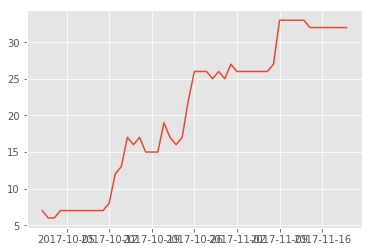

In [26]:
data_bts_temp = data_bts_temp[data_bts_temp.flow_day > 0]  #剔除人流量为0的天数
device_date = data_bts_temp.groupby('date').apply(len)
plt.plot(device_date)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


66100036588920

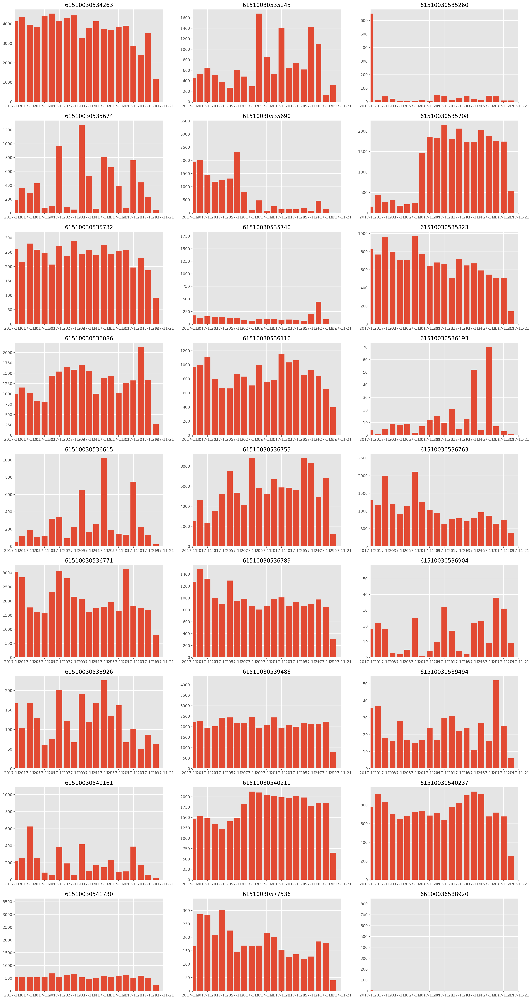

In [49]:
#选取11.01-11.20有完整数据的设备
device_list = list(data_bts_temp[data_bts_temp.date == pd.to_datetime('2017-11-01').date()].DeviceCode.unique())
fig = plt.figure(figsize=(24,48),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(9, 3, i+1)
    data_temp = data_bts_temp[data_bts.DeviceCode == device_list[i]]
    data_temp = data_temp.sort_values('date')
    ax.bar(data_temp.date, height=data_temp.flow_day)
    ax.set_title(str(device_list[i]))
    ax.set_xlim(pd.to_datetime('2017-11-01'), pd.to_datetime('2017-11-21'))
device_list.pop()  #删除异常设备

# 基于26台设备11.01-11.20的数据初步分析

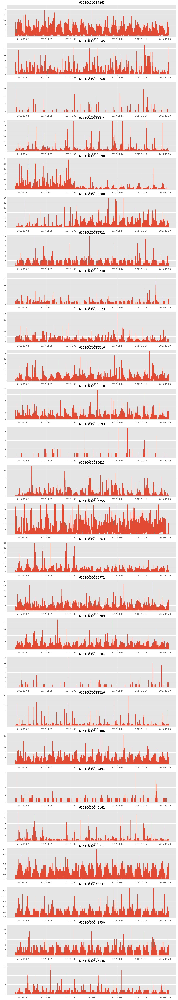

In [56]:
data_complete = data_bts[data_bts.DeviceCode.isin(device_list)]
data_complete = data_complete[data_complete.Time > pd.to_datetime('2017-11-01')]
#添加时间窗
tw_span = '5min'
data_complete['tw'] = data_complete.Time.apply(lambda x:(x - pd.to_datetime('2017-11-01 00:00:00'))//pd.Timedelta(tw_span))
fig = plt.figure(figsize=(15,90),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(26,1,i+1)
    data_temp = data_complete[data_complete.DeviceCode==device_list[i]]
    data_temp = data_temp.sort_values('Time')
    ax.plot(data_temp.Time, data_temp.HumanFlow)
    ax.set_title(str(device_list[i]))

In [67]:
#时间窗内人数求和加总
def human_flow_sum(frame):
    frame['HumanFlow_tw'] = frame.HumanFlow.sum()
    return frame
data_complete = data_complete.groupby(['DeviceCode','tw']).apply(human_flow_sum).reset_index(drop=True)

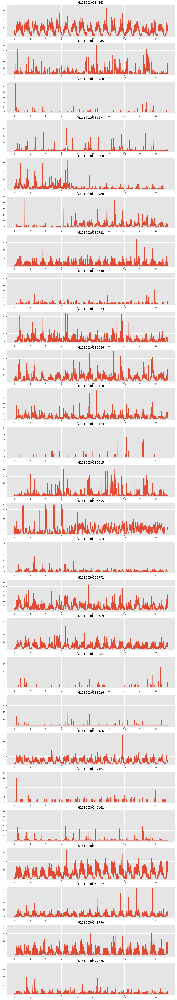

In [82]:
data_complete_human = data_complete[['DeviceCode','date','tw','HumanFlow_tw']]
data_complete_human = data_complete_human.drop_duplicates()
fig = plt.figure(figsize=(15,90),dpi=200)
for i in range(len(device_list)):
    ax = fig.add_subplot(26,1,i+1)
    data_temp = data_complete_human[data_complete_human.DeviceCode==device_list[i]]
    data_temp = data_temp.sort_values('tw')
    ax.plot(data_temp.tw, data_temp.HumanFlow_tw)
    ax.set_title(str(device_list[i]))
    ax.set_xticks(np.arange(0,5760,576))
    ax.set_xticklabels(np.arange(1,21,2))